In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import itertools
import random
from operator import itemgetter
import matplotlib.pyplot as plt
import operator

##### 1. Creating a directed graph.

In [2]:
import networkx as nx

# Create the directed graph
G = nx.DiGraph()

# Add edges from your file
with open('connections.txt', 'r') as f:
    for line in f:
        node1, node2 = map(int, line.strip().split())
        G.add_edge(node1, node2)


##### 2. Show which nodes are bridges.

In [3]:
# Convert to undirected graph
G_undirected = G.to_undirected()

# Find bridges
bridges = list(nx.bridges(G_undirected))
print("Bridges in the graph are: ", bridges)

Bridges in the graph are:  [(0, 11), (0, 12), (0, 15), (0, 18), (0, 37), (0, 43), (0, 74), (0, 114), (0, 209), (0, 210), (0, 215), (0, 287), (0, 292), (0, 335), (107, 911), (107, 918), (107, 1096), (107, 1119), (107, 1145), (107, 1206), (107, 1386), (107, 1466), (107, 1560), (107, 1581), (107, 1834), (348, 358), (348, 447), (348, 550), (414, 585), (414, 602), (414, 607), (414, 608), (414, 613), (414, 624), (414, 638), (414, 668), (414, 674), (1684, 2842), (1684, 3031), (1684, 3071), (1684, 3183), (1684, 3230), (1912, 2079), (1912, 2195), (1912, 2269), (1912, 2457), (1912, 2470), (1912, 2569), (1912, 2596), (3437, 3451), (3437, 3453), (3437, 3570), (3437, 3650), (3437, 3709), (3437, 3729), (3437, 3748), (3437, 3798), (3437, 3820), (3437, 3853), (3437, 3856), (3437, 3935), (3437, 3974), (3980, 3984), (3980, 4008), (3980, 4010), (3980, 4015), (3980, 4022), (3980, 4024), (3980, 4035), (686, 692), (686, 801), (698, 875), (698, 883), (698, 891), (698, 892)]


##### 3. Show the density of the graph. Comment on your findings.

In [4]:
density = nx.density(G)
print("Density of the graph is: ", density)

Density of the graph is:  0.0054099817517196435


The density of the graph is a measure of how interconnected the network is. A value of 0.0054 is relatively low, indicating that our network is fairly sparse,meaning that relatively few of the possible edges between nodes exist in the graph.

##### 4. Show which nodes have the highest and lowest number of connections

In [5]:
# Compute the degree for each node
degrees = G.degree()

# Sort nodes by degree
sorted_nodes_by_degree = sorted(degrees, key=lambda x: x[1], reverse=True)

# Nodes with highest and lowest number of connections
node_highest_degree = sorted_nodes_by_degree[0]
node_lowest_degree = sorted_nodes_by_degree[-1]

print(f"Node with highest number of connections: {node_highest_degree}")
print(f"Node with lowest number of connections: {node_lowest_degree}")

Node with highest number of connections: (107, 1045)
Node with lowest number of connections: (4035, 1)


In [6]:
from heapq import nlargest, nsmallest
degrees = dict(G.degree)
highest_degrees = nlargest(10, degrees, key = degrees.get)
for i in highest_degrees:
    print(f'Node {i}: Degree {degrees[i]}')

Node 107: Degree 1045
Node 1684: Degree 792
Node 1912: Degree 755
Node 3437: Degree 547
Node 0: Degree 347
Node 2543: Degree 294
Node 2347: Degree 291
Node 1888: Degree 254
Node 1800: Degree 245
Node 1663: Degree 235


In [7]:
# nodes with lowest number of connections
# I considered the nodes that have connections less than or equal to 3
lowest_degrees = [{i:degrees[i]} for i in degrees if degrees[i] <= 3]
print(lowest_degrees)

[{11: 1}, {12: 1}, {15: 1}, {18: 1}, {33: 2}, {35: 2}, {37: 1}, {42: 2}, {43: 1}, {47: 2}, {52: 2}, {61: 3}, {70: 2}, {71: 3}, {74: 1}, {76: 3}, {81: 3}, {90: 2}, {97: 3}, {112: 3}, {114: 1}, {138: 2}, {145: 2}, {153: 2}, {154: 2}, {155: 3}, {157: 3}, {160: 2}, {164: 3}, {179: 3}, {182: 3}, {183: 2}, {191: 3}, {205: 2}, {207: 3}, {209: 1}, {210: 1}, {215: 1}, {216: 2}, {228: 3}, {233: 2}, {234: 2}, {240: 3}, {241: 2}, {244: 2}, {247: 3}, {253: 3}, {255: 2}, {256: 2}, {267: 2}, {279: 2}, {282: 2}, {286: 2}, {287: 1}, {292: 1}, {293: 3}, {294: 3}, {301: 3}, {305: 2}, {316: 2}, {321: 3}, {335: 1}, {336: 3}, {2814: 2}, {899: 3}, {904: 3}, {911: 1}, {918: 1}, {1027: 3}, {1034: 3}, {1046: 3}, {1065: 2}, {1071: 3}, {1096: 1}, {1119: 1}, {1145: 1}, {1176: 2}, {1206: 1}, {1208: 3}, {1224: 2}, {1233: 2}, {1252: 3}, {1253: 3}, {1262: 2}, {1270: 2}, {1276: 2}, {1326: 2}, {1353: 3}, {1362: 3}, {1386: 1}, {1394: 2}, {1395: 2}, {1430: 2}, {1466: 1}, {1546: 3}, {1558: 2}, {1560: 1}, {1581: 1}, {1586: 

##### 5. Show which nodes have the highest incoming and outgoing connections.

In [8]:
in_degrees = dict(G.in_degree)
out_degrees = dict(G.out_degree)

highest_IN_degrees = nlargest(10, in_degrees, key = in_degrees.get)
highest_OUT_degrees = nlargest(10, out_degrees, key = out_degrees.get)

print("==========IN DEGREES==========")
for i in highest_IN_degrees:
    print(f'Node {i}: Degree {in_degrees[i]}')
    

print("==========OUT DEGREES==========")
for i in highest_OUT_degrees:
    print(f'Node {i}: Degree {out_degrees[i]}')

==========IN DEGREES==========
Node 1888: Degree 251
Node 2543: Degree 246
Node 1800: Degree 216
Node 2611: Degree 197
Node 1827: Degree 186
Node 1730: Degree 183
Node 2607: Degree 183
Node 1833: Degree 182
Node 2602: Degree 182
Node 2604: Degree 182
==========OUT DEGREES==========
Node 107: Degree 1043
Node 1684: Degree 778
Node 1912: Degree 748
Node 3437: Degree 542
Node 0: Degree 347
Node 348: Degree 225
Node 1941: Degree 215
Node 1985: Degree 207
Node 483: Degree 191
Node 1917: Degree 189


##### 6. Show which nodes have the highest closeness, betweenness, and eigenvector| Interpret your findings.

In [9]:
# Calculate Closeness centrality
closeness_centrality = nx.closeness_centrality(G)

# Node with highest closeness centrality
node_with_highest_closeness = max(closeness_centrality, key=closeness_centrality.get)

# Calculate Betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Node with highest betweenness centrality
node_with_highest_betweenness = max(betweenness_centrality, key=betweenness_centrality.get)


print(f"Node with highest closeness centrality: {node_with_highest_closeness}")
print(f"Node with highest betweenness centrality: {node_with_highest_betweenness}")

Node with highest closeness centrality: 2642
Node with highest betweenness centrality: 1684


In [10]:
# calculating eigenvector centralities for in and out edges
eigenvector_in = nx.eigenvector_centrality(G, max_iter=300)
eigenvector_out = nx.eigenvector_centrality(G.reverse(), max_iter=300)

# calculating eigenvector centralities for every node
eigenvector = {}
for key in eigenvector_in.keys():
    eigenvector[key] = (eigenvector_in[key] + eigenvector_out[key])/2
    
# top 10 nodes with higest eigen vector
e_vec = nlargest(10, eigenvector, key=eigenvector.get)
for i in e_vec:
    print(f'Node {i}: Eigenvector {eigenvector[i]}')

Node 0: Eigenvector 0.4419361459191112
Node 2655: Eigenvector 0.4013521498353261
Node 2654: Eigenvector 0.23993423112534543
Node 3: Eigenvector 0.14863178689048834
Node 9: Eigenvector 0.12565044899639224
Node 2646: Eigenvector 0.11377629041020572
Node 13: Eigenvector 0.0907191228782389
Node 2638: Eigenvector 0.08909843274277293
Node 2631: Eigenvector 0.08346591284941768
Node 21: Eigenvector 0.07700765665617419


Closeness Centrality (Node 2642): Node 2642 has the highest closeness centrality, which means it is relatively close to all other nodes in the network. Targeting this individual could potentially influence a large portion of the network, as messages or advertising could disseminate rapidly from this central point to the rest of the network.

Betweenness Centrality (Node 1684): Node 1684 has the highest betweenness centrality, which suggests this individual acts as a bridge in the network and is on many of the shortest paths between other nodes. Therefore, targeting this individual could be a good strategy to reach disconnected parts of the network, as information could pass through this node to reach other nodes.

Eigenvector Centrality (Node 0): Node 0 has the highest eigenvector centrality, indicating it is connected to many nodes that are themselves highly connected. Targeting this node could lead to a substantial impact, as it can potentially influence other influential nodes in the network.

##### 7. Implement a community detection algorithm on the directed graph and show how many communities were created.

In [11]:
from infomap import Infomap
def findCommunities(G):
    im = Infomap("--two-level --directed")
    print("Building Infomap network from a NetworkX graph...")
    
    for e in G.edges():
        im.addLink(*e)
        
    print("Find communities with Infomap...")
    im.run();
    print("Found {0} communities with codelength: {1}".format(im.num_top_modules,
    im.codelength))
    communities = {}
    
    for node in im.tree:
        communities[node.node_id] = node.module_id
        
    nx.set_node_attributes(G, communities,'community')
    return im.num_top_modules

In [12]:
print(findCommunities(G))

Building Infomap network from a NetworkX graph...
Find communities with Infomap...
  Infomap v2.7.1 starts at 2023-05-18 23:13:41
  -> Input network: 
  -> No file output!
  -> Configuration: two-level
                    directed
  -> Ordinary network input, using the Map Equation for first order network flows
Calculating global network flow using flow model 'directed'... Found 98 communities with codelength: 6.587416522147202

  -> Using unrecorded teleportation to links. 
  -> PageRank calculation done in 84 iterations.

  => Sum node flow: 1, sum link flow: 1
Build internal network with 4039 nodes and 88234 links...
  -> One-level codelength: 9.86597315

Trial 1/1 starting at 2023-05-18 23:13:41
Two-level compression: 33% 0.72% 0.0611712068% 0.0123350569% 98


We found out that there were 98 communities created.

##### 8. Show the largest and the smallest community. | Interpret your findings.

In [13]:
# creating a dict of nodes and their corresponding communities
nodes_comm = dict((n, d["community"]) for n, d in G.nodes().items())
# creating a list of all communities (they are repeating)
comms = np.array(list(nodes_comm.values()))
# taking unique communities
distinct_comms = np.unique(comms)

# dictionary for each communitie and the number of nodes there
comm_count = {}
#filling above dictionary
for com in distinct_comms:
    count = np.count_nonzero(comms == com)
    comm_count[com] = count
   

maximum = max(comm_count, key=comm_count.get)
minimum = min(comm_count, key=comm_count.get)

print(f"Largest  {maximum}, {comm_count[maximum]} ")
print(f"Smallest {minimum}, {comm_count[minimum]} ")

Largest  5, 432 
Smallest 38, 2 


In [14]:
larg3_com = nlargest(3, comm_count, key=comm_count.get)
for i in larg3_com:
    print(f'Community {i} with {comm_count[i]} nodes')

Community 5 with 432 nodes
Community 3 with 333 nodes
Community 2 with 271 nodes


#### 9

In [15]:
selected_data5 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 5)
selected_data3 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 3)
selected_data2 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 2)


sg5 = G.subgraph(list(selected_data5.keys()))
sg3 = G.subgraph(list(selected_data3.keys()))
sg2= G.subgraph(list(selected_data2.keys()))

In [16]:
# keeping graphs in a list
graphs = [sg5, sg3, sg2]

options = {
    "with_labels": False,
    "node_size": 100,
    "node_color": "#00A0DC",
    "edgecolors": "black",
    "linewidths": 0.7,
    "width": 0.35,
}

# fucntion for plotting graphs
def plot_graphs(graphs):
    for g in graphs:
        plt.figure(figsize=(15, 15))
        nx.draw_networkx(g, **options)
    plt.show()

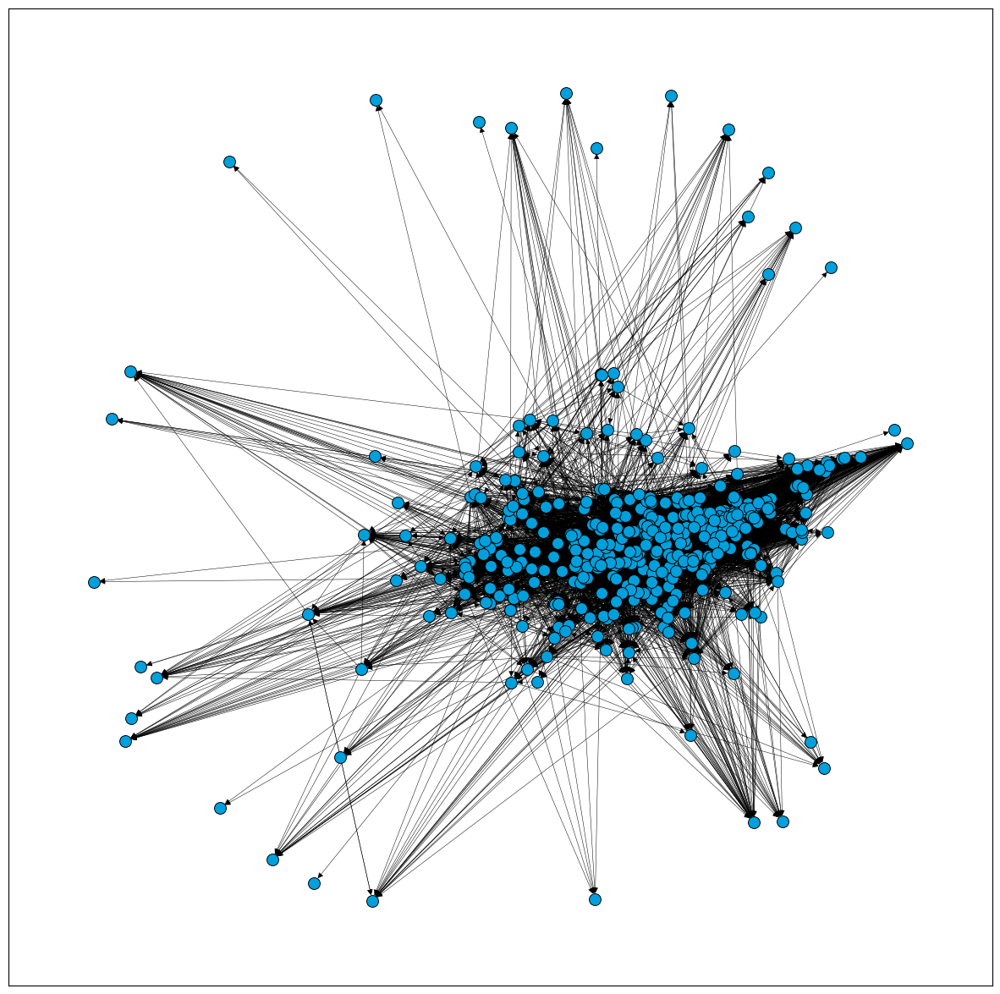

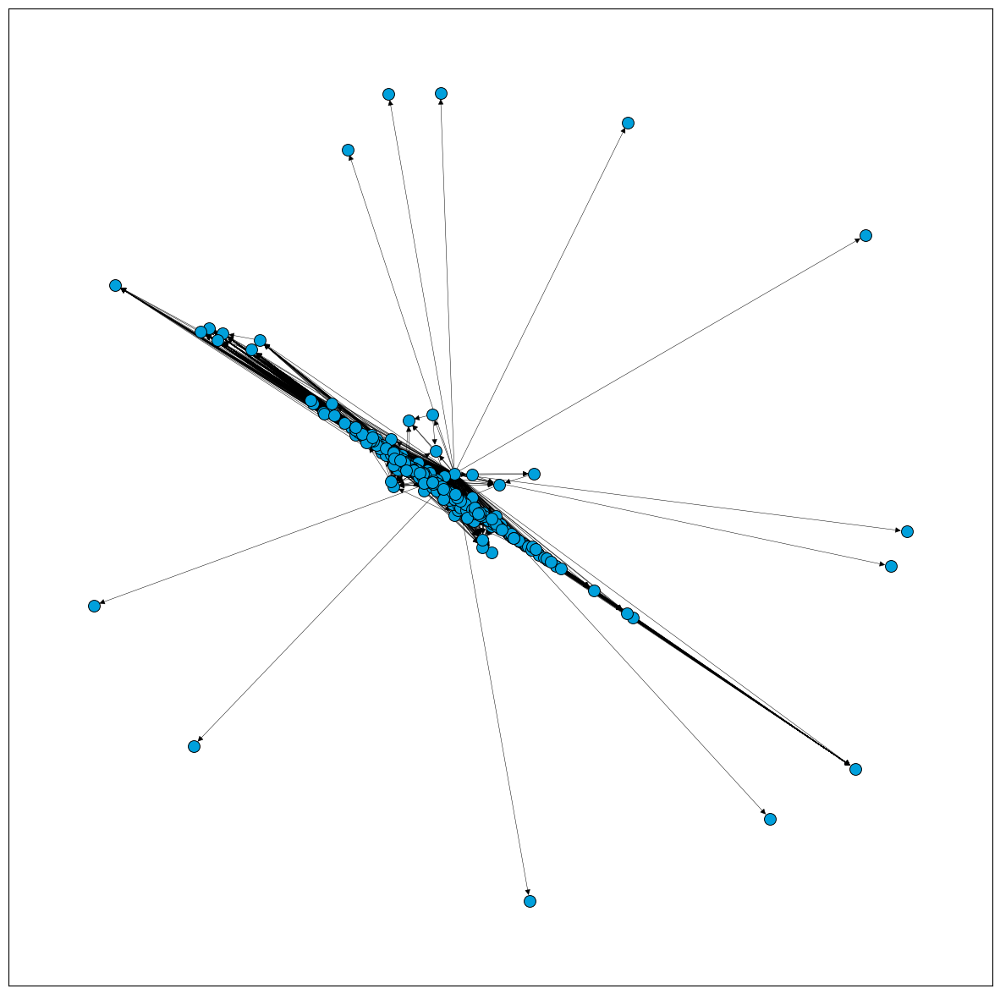

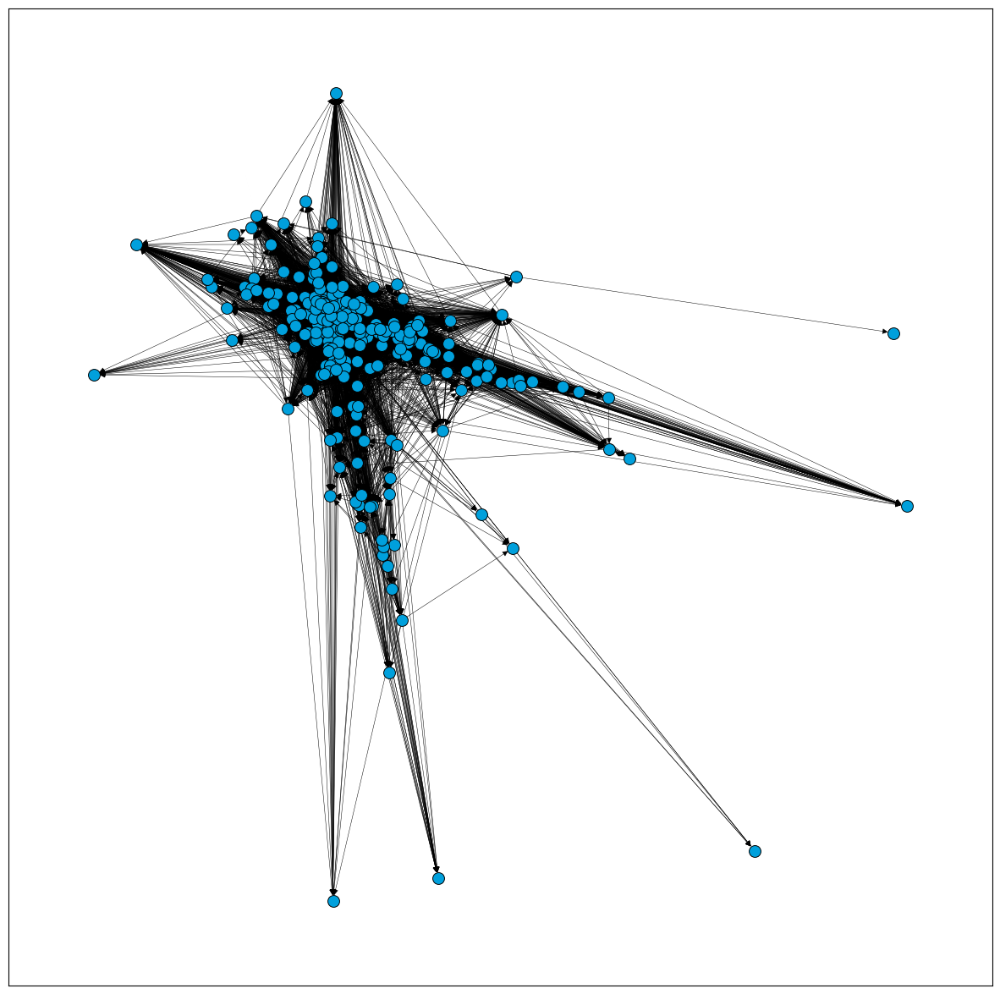

In [17]:
plot_graphs(graphs)

In [18]:
def topN(graph, n, degree=False, close=False, between=False, eigen=False):
    if degree == True:
        word = "Degree"
        measures = nx.degree_centrality(graph)
       
    elif close == True:
        word = "Closeness"
        measures = nx.closeness_centrality(graph)
       
    elif between == True:
        word = "Betweenness"
        measures = nx.betweenness_centrality(graph)
       
    elif eigen == True:
        word = "Eigenvector"
        measures_in = nx.eigenvector_centrality(graph, max_iter=1000)
        measures_out = nx.eigenvector_centrality(graph.reverse(), max_iter=1000)
       
        measures = {}
        for key in measures_in.keys():
            measures[key] = (measures_in[key] + measures_out[key])/2
       
    top_nodes = nlargest(n, measures, key=measures.get)
   
    for i in top_nodes:
        print(f'Node {i}: {word} Centrality {measures[i]}')
    print("\n")
    return top_nodes

# Degree centralities 
sg5_deg = topN(sg5, 3, degree=True)
sg3_deg = topN(sg3, 3, degree=True)
sg2_deg = topN(sg2, 3, degree=True)

Node 1684: Degree Centrality 1.0
Node 3101: Degree Centrality 0.27842227378190254
Node 3291: Degree Centrality 0.27610208816705334


Node 107: Degree Centrality 1.0
Node 1800: Degree Centrality 0.677710843373494
Node 1663: Degree Centrality 0.6686746987951807


Node 2111: Degree Centrality 0.674074074074074
Node 2384: Degree Centrality 0.674074074074074
Node 2047: Degree Centrality 0.625925925925926




In [19]:
# Closeness
sg5_close = topN(sg5, 3, close=True)
sg3_close = topN(sg3, 3, close=True)
sg2_close = topN(sg2, 3, close=True)

# Betweenness 
sg5_bet = topN(sg5, 3, between=True)
sg3_bet = topN(sg3, 3, between=True)
sg2_bet = topN(sg2, 3, between=True)

# Eigenvector centralities 
sg5_eig = topN(sg5, 3, eigen=True)
sg3_eig = topN(sg3, 3, eigen=True)
sg2_eig = topN(sg2, 3, eigen=True)

Node 3434: Closeness Centrality 0.47770571965859704
Node 3397: Closeness Centrality 0.4738012374323279
Node 3406: Closeness Centrality 0.4369007800469994


Node 1800: Closeness Centrality 0.685664769631289
Node 1827: Closeness Centrality 0.6548819713242108
Node 1833: Closeness Centrality 0.6532024960829866


Node 2598: Closeness Centrality 0.6383228926255633
Node 2649: Closeness Centrality 0.615820868945869
Node 2642: Closeness Centrality 0.6059710930442638


Node 2951: Betweenness Centrality 0.012827308809200537
Node 3101: Betweenness Centrality 0.010470261599790543
Node 3154: Betweenness Centrality 0.010408366548461731


Node 1352: Betweenness Centrality 0.008462892852108496
Node 1471: Betweenness Centrality 0.006931615636648119
Node 1431: Betweenness Centrality 0.006481722891275275


Node 2289: Betweenness Centrality 0.01679094611163723
Node 2384: Betweenness Centrality 0.013602408613304222
Node 2133: Betweenness Centrality 0.012552938382275437


Node 3434: Eigenvector Centrality 0.

In [20]:
# Top degree - red, rest #00A0DC
color_deg_sg5 = ["red" if node in sg5_deg else "#00A0DC" for node in sg5.nodes]
color_deg_sg3 = ["red" if node in sg3_deg else "#00A0DC" for node in sg3.nodes]
color_deg_sg2 = ["red" if node in sg2_deg else "#00A0DC" for node in sg2.nodes]

# Top closeness - red, rest #00A0DC
color_close_sg5 = ["red" if node in sg5_close else "#00A0DC" for node in sg5.nodes]
color_close_sg3 = ["red" if node in sg3_close else "#00A0DC" for node in sg3.nodes]
color_close_sg2 = ["red" if node in sg2_close else "#00A0DC" for node in sg2.nodes]

# Top betweenness - red, rest #00A0DC
color_bet_sg5 = ["red" if node in sg5_bet else "#00A0DC" for node in sg5.nodes]
color_bet_sg3 = ["red" if node in sg3_bet else "#00A0DC" for node in sg3.nodes]
color_bet_sg2 = ["red" if node in sg2_bet else "#00A0DC" for node in sg2.nodes]

# Top eigenvector - red, rest #00A0DC
color_eig_sg5 = ["red" if node in sg5_eig else "#00A0DC" for node in sg5.nodes]
color_eig_sg3 = ["red" if node in sg3_eig else "#00A0DC" for node in sg3.nodes]
color_eig_sg2 = ["red" if node in sg2_eig else "#00A0DC" for node in sg2.nodes]

def plot_function(graph_list, color_list):
   
    for g, c in zip(graph_list, color_list):
        options = {
            "with_labels": False,
            "node_size": 100,
            "node_color": c,
            "edgecolors": "black",
            "linewidths": 0.7,
            "width": 0.35,
        }
       
        plt.figure(figsize=(15, 15))
        nx.draw_networkx(g, **options)
    plt.show()

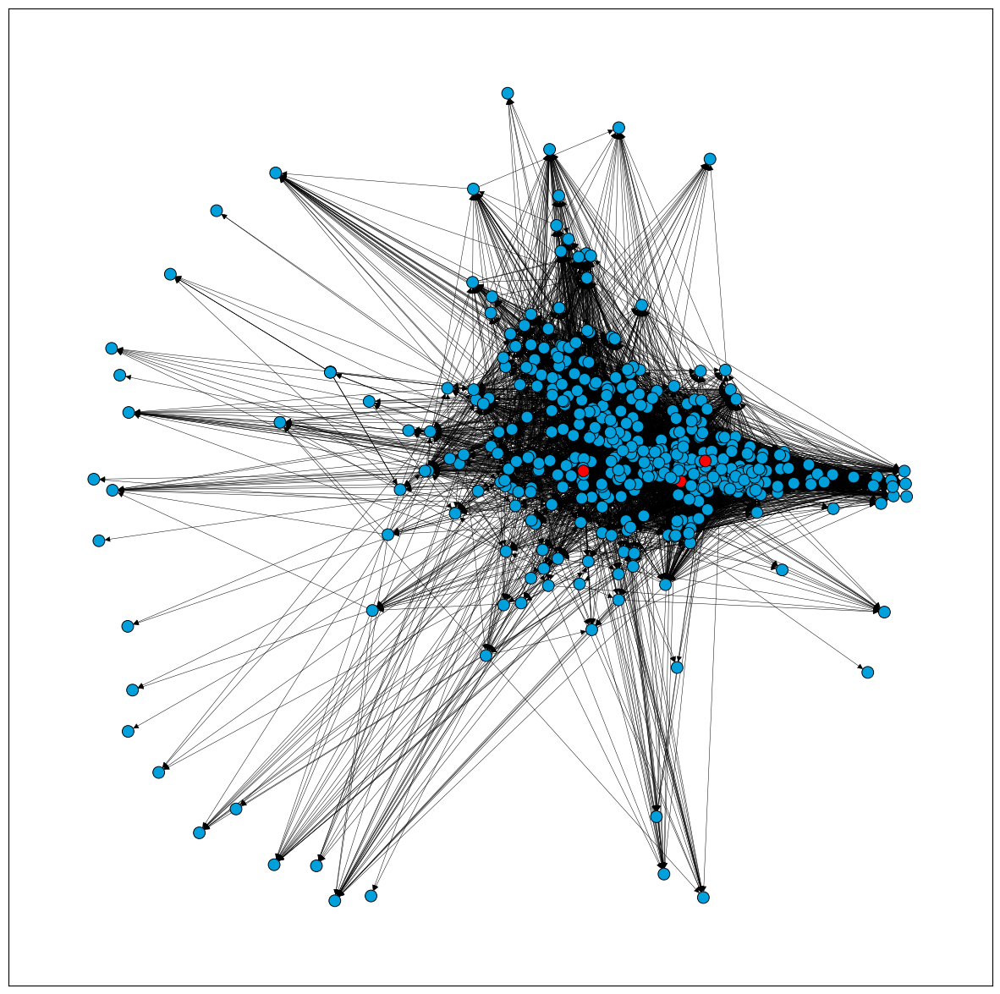

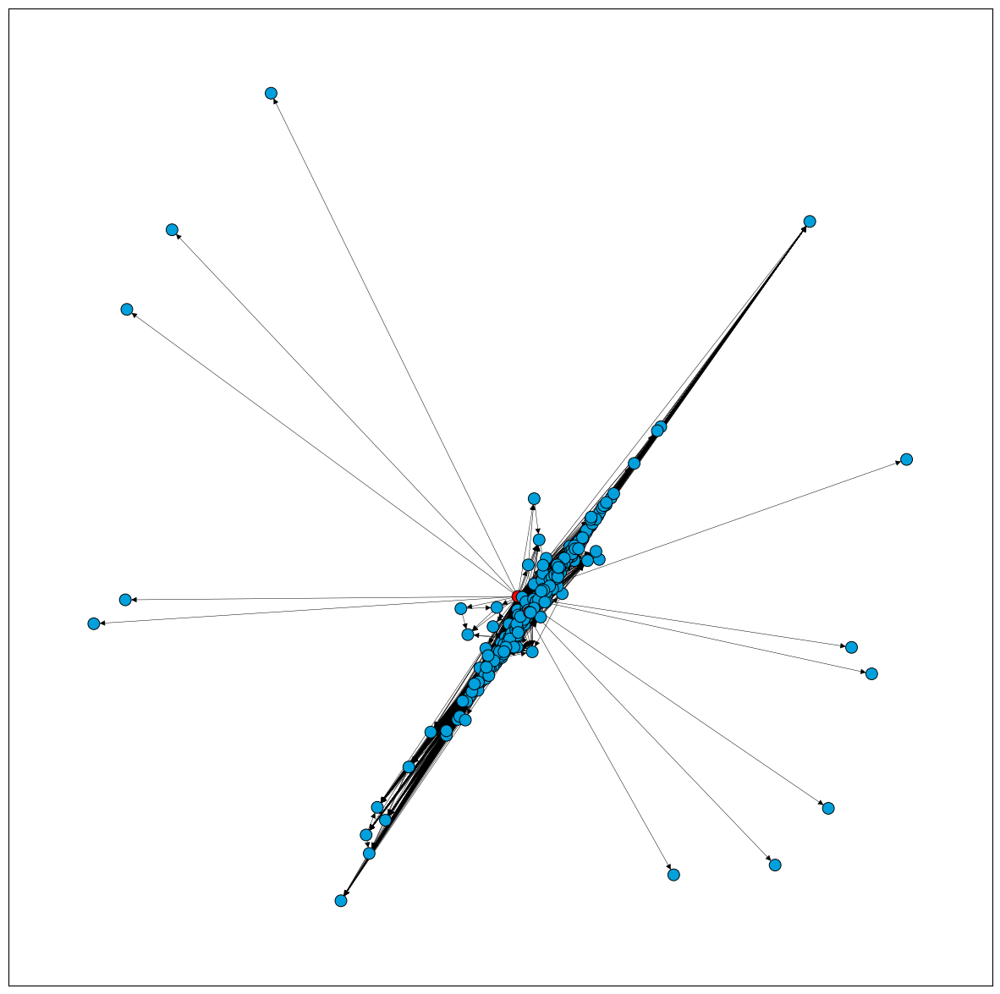

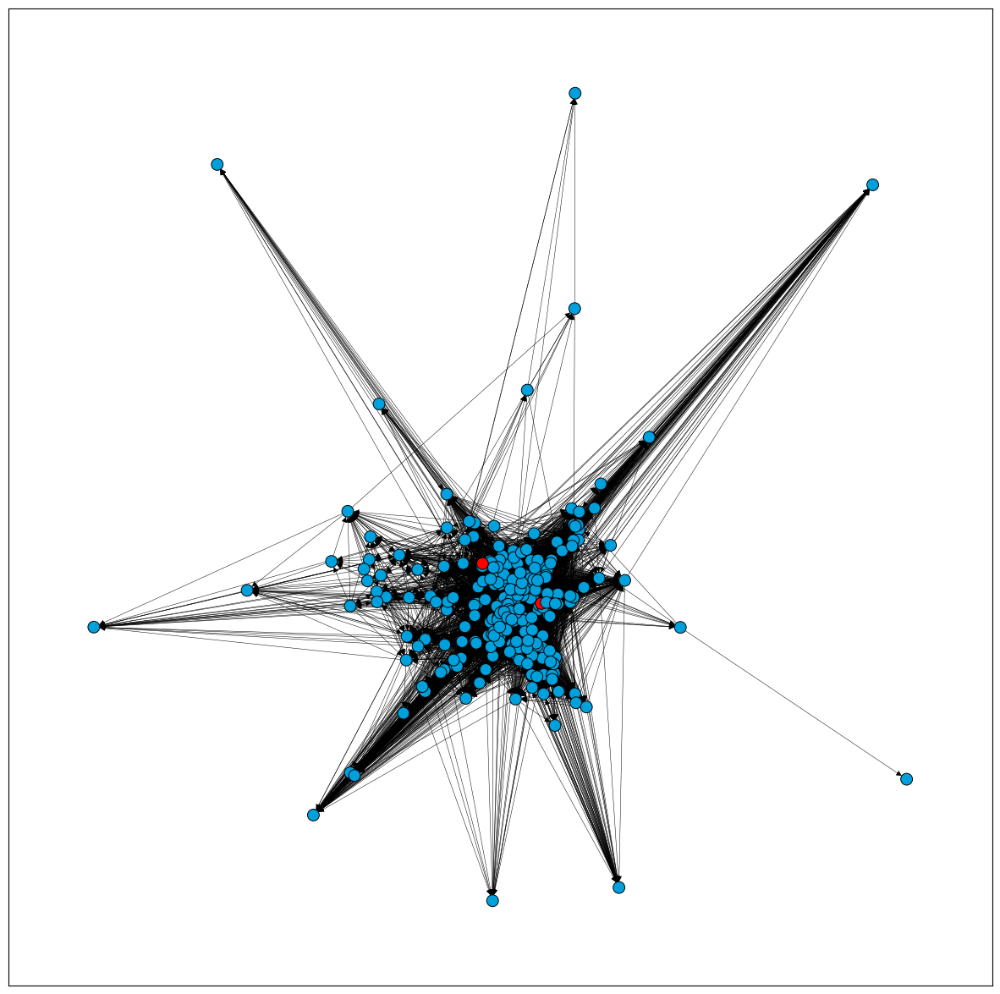

In [21]:
plot_function(graphs, [color_deg_sg5, color_deg_sg3, color_deg_sg2])

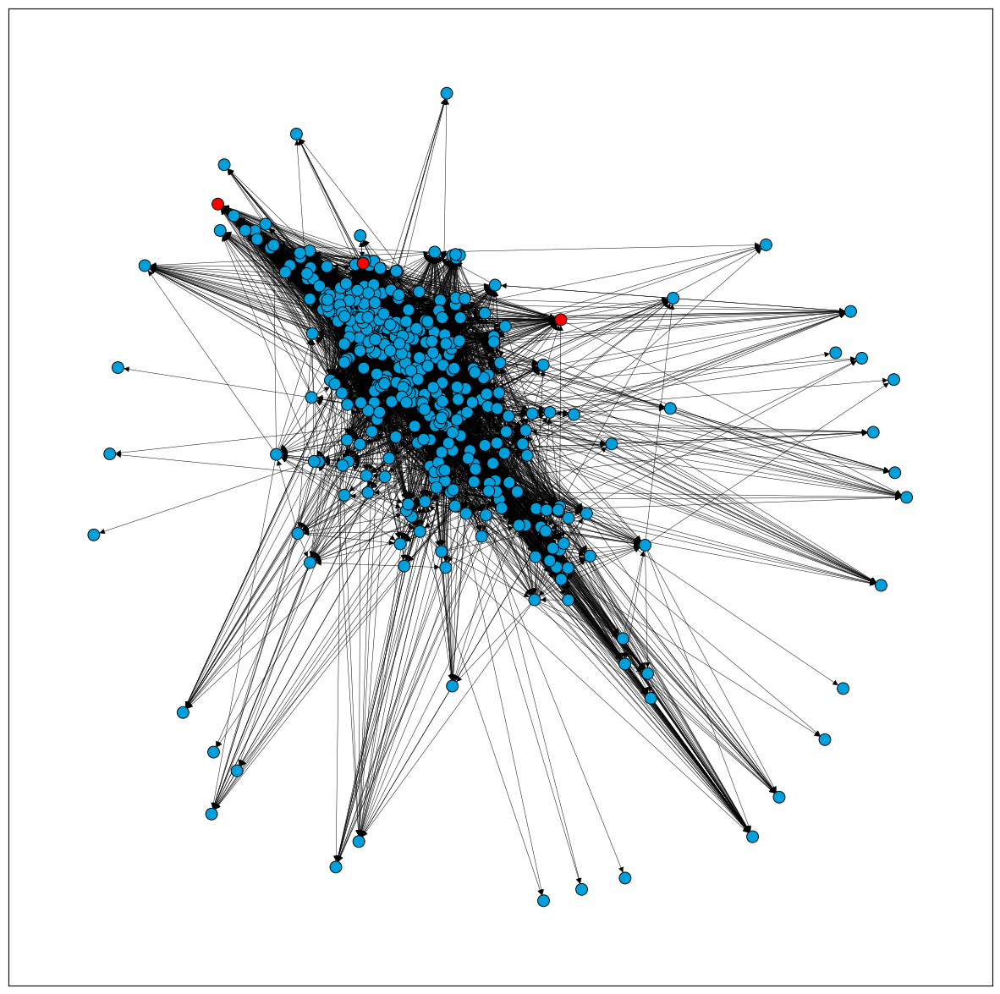

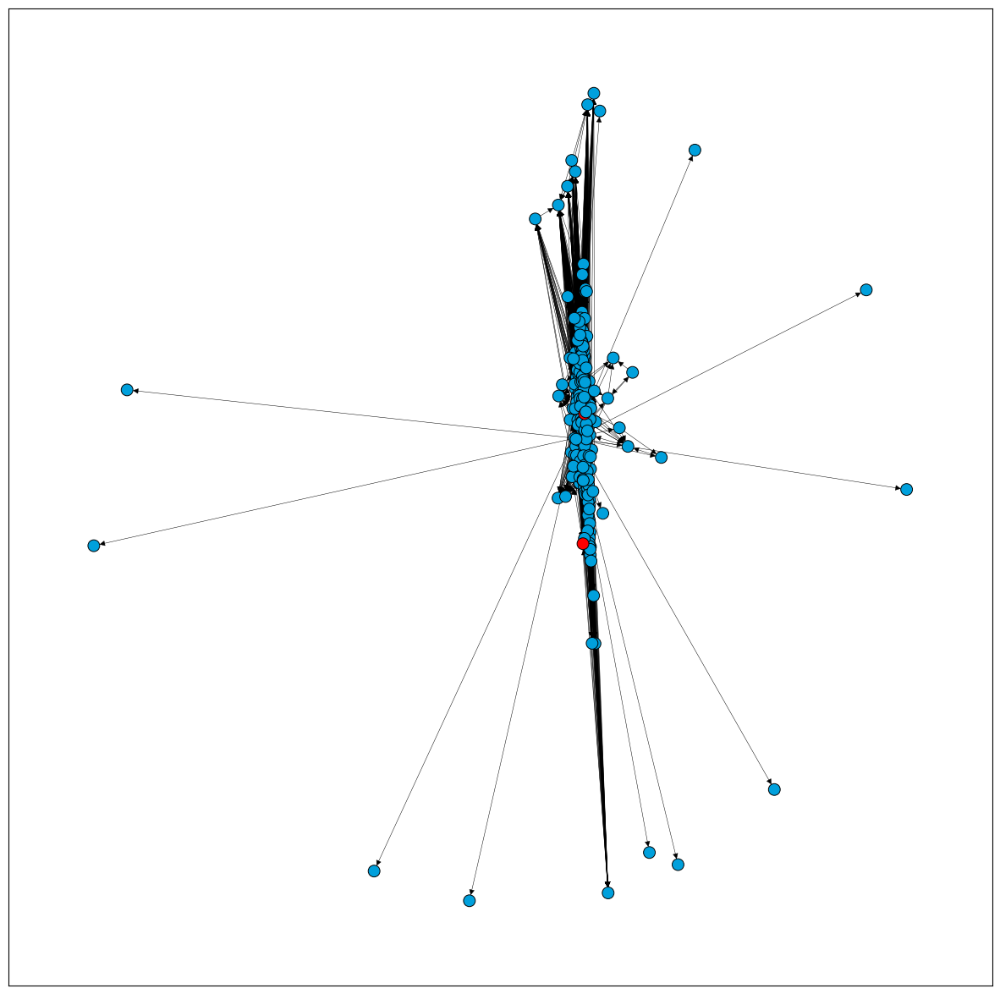

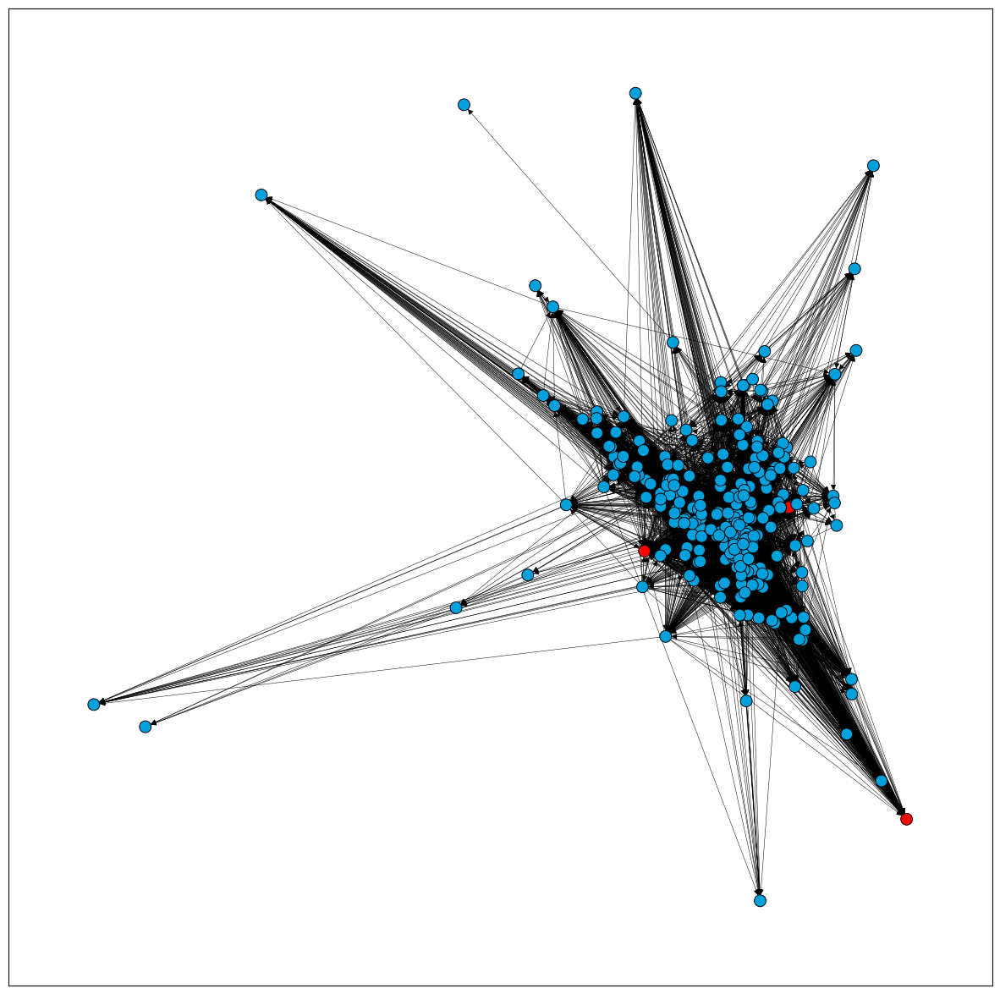

In [22]:
plot_function(graphs, [color_close_sg5, color_close_sg3, color_close_sg2])

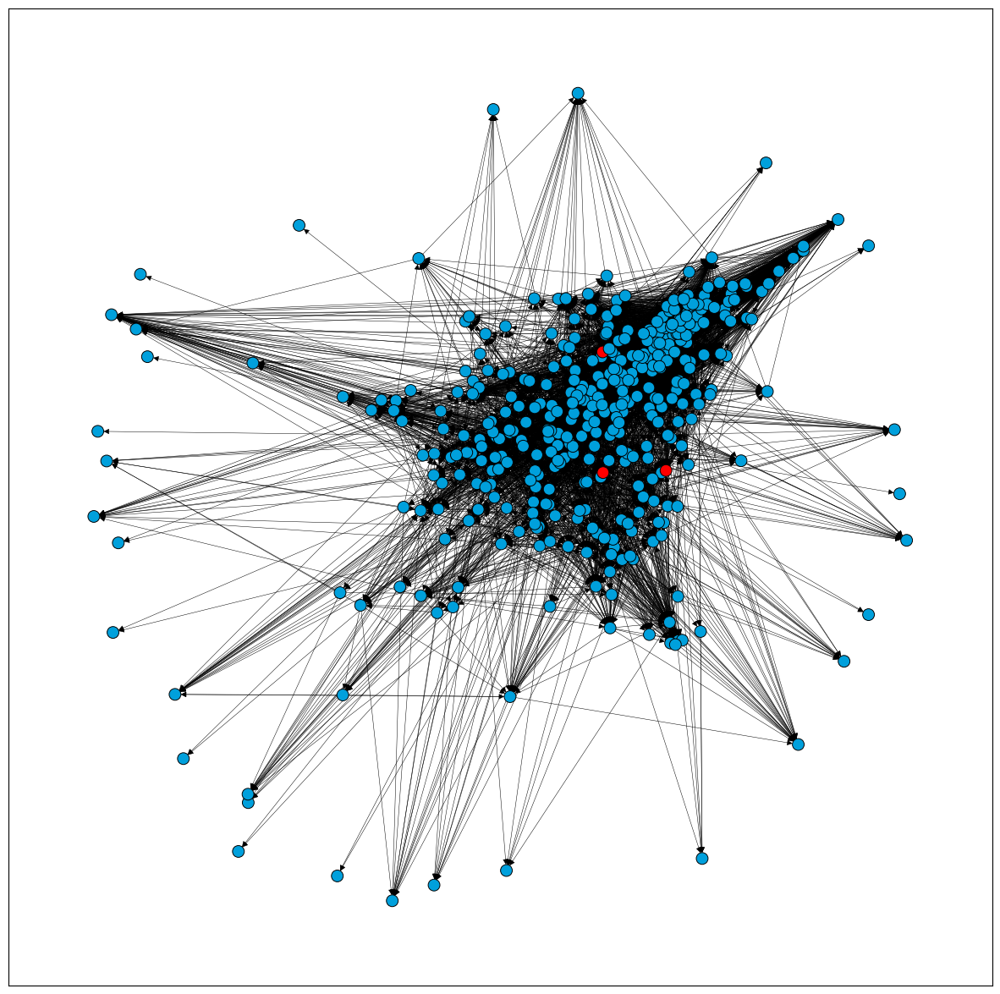

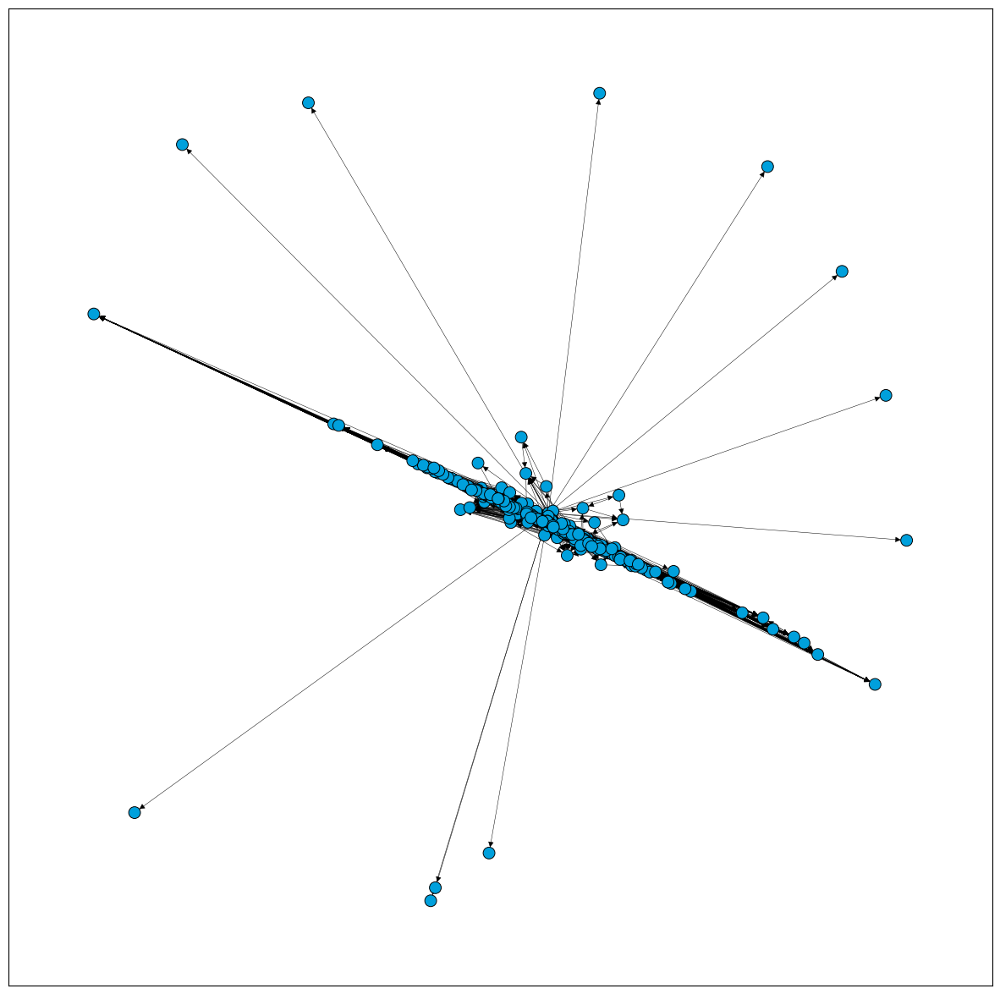

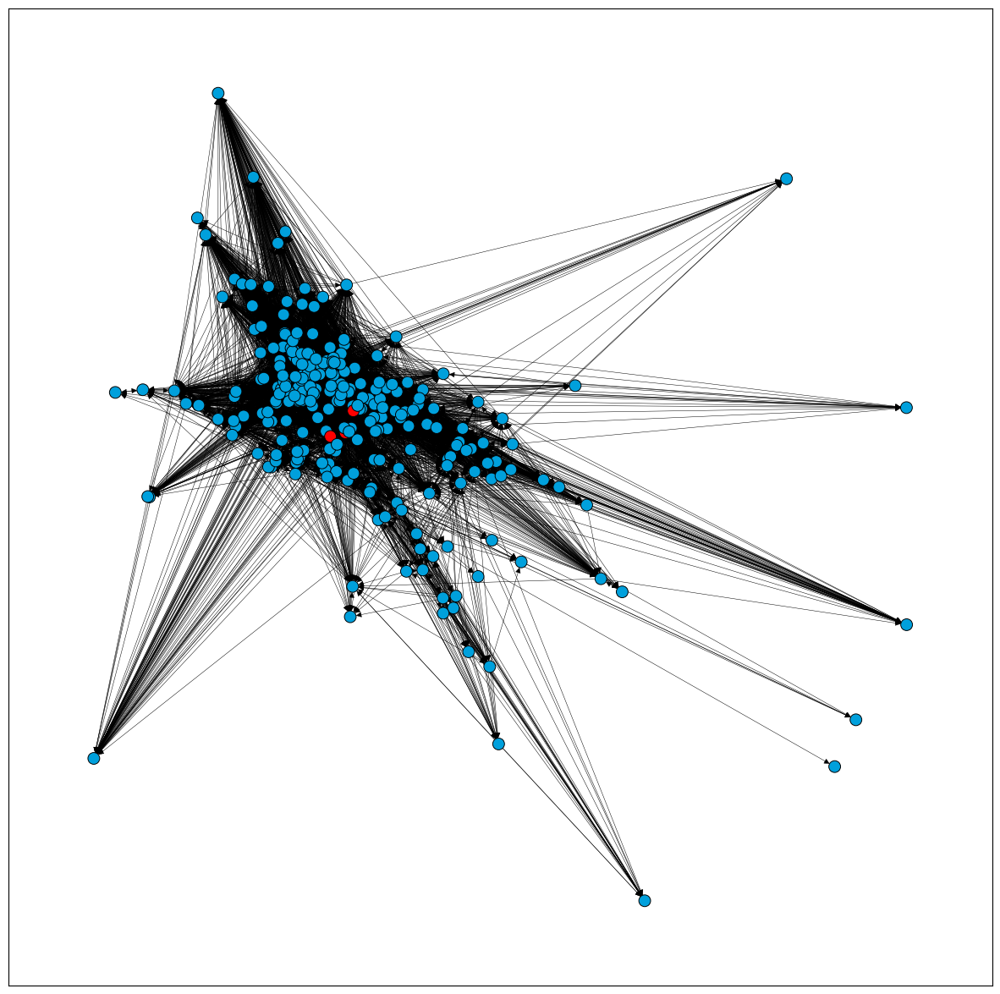

In [23]:
plot_function(graphs, [color_bet_sg5, color_bet_sg3, color_bet_sg2])

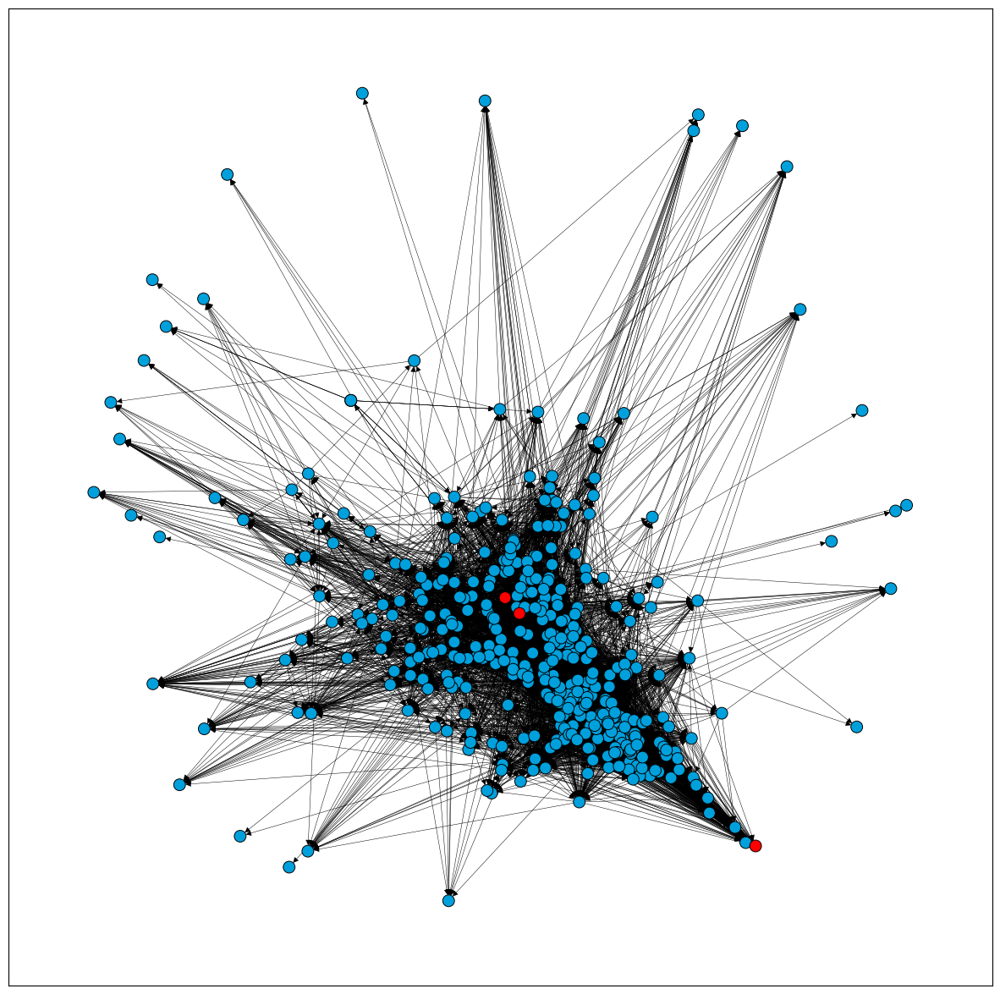

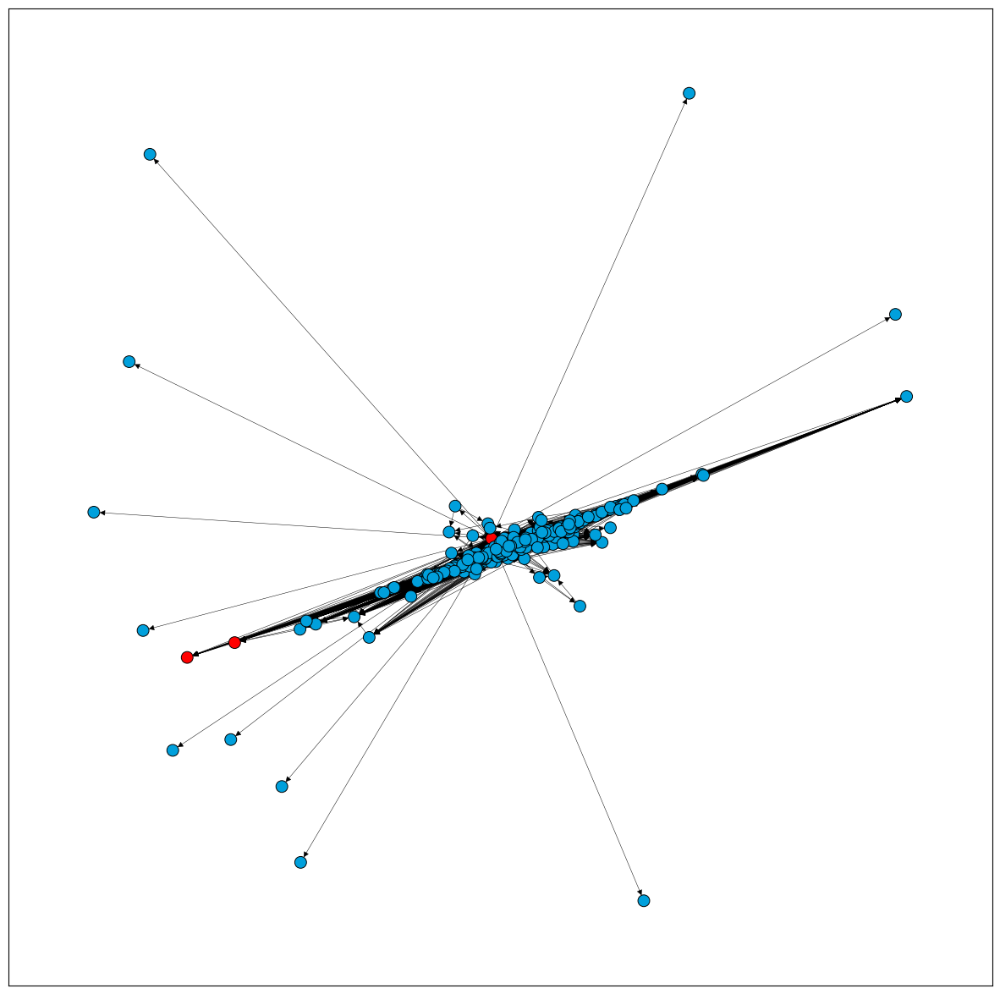

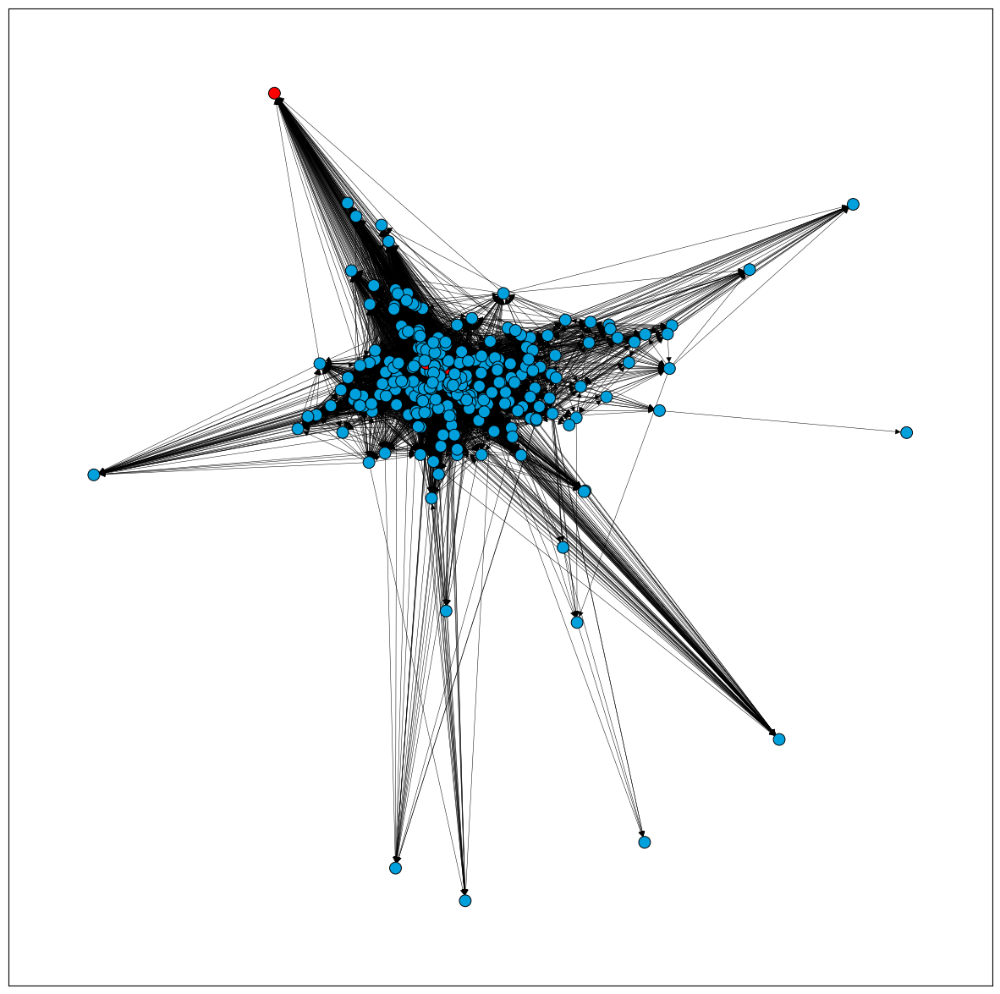

In [24]:
plot_function(graphs, [color_eig_sg5, color_eig_sg3, color_eig_sg2])

#### 10

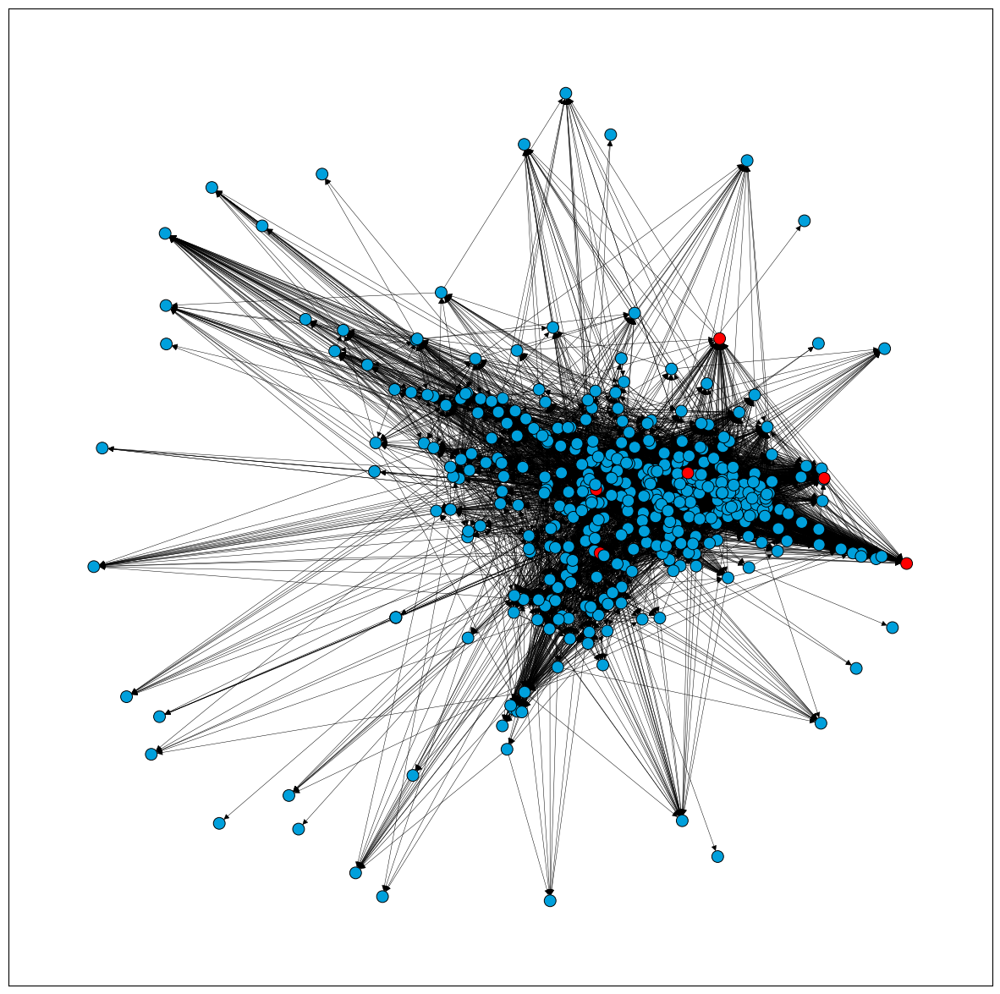

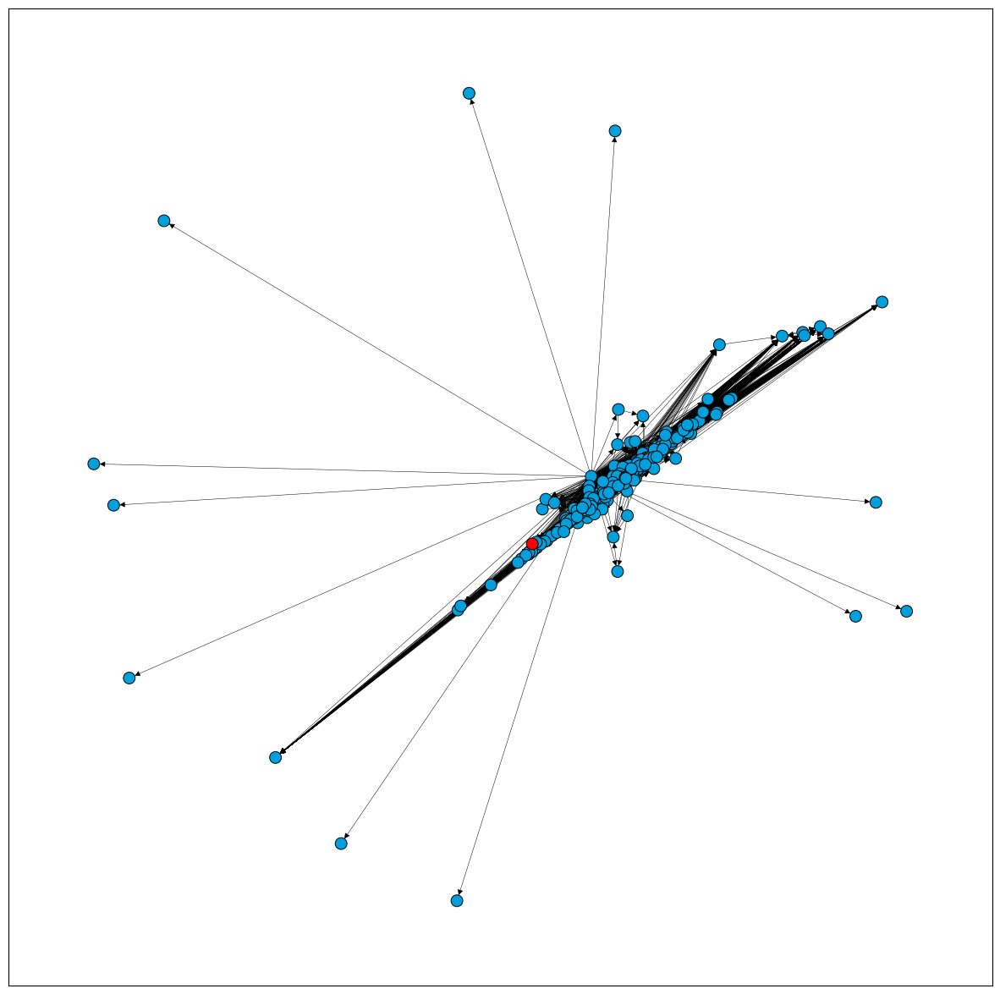

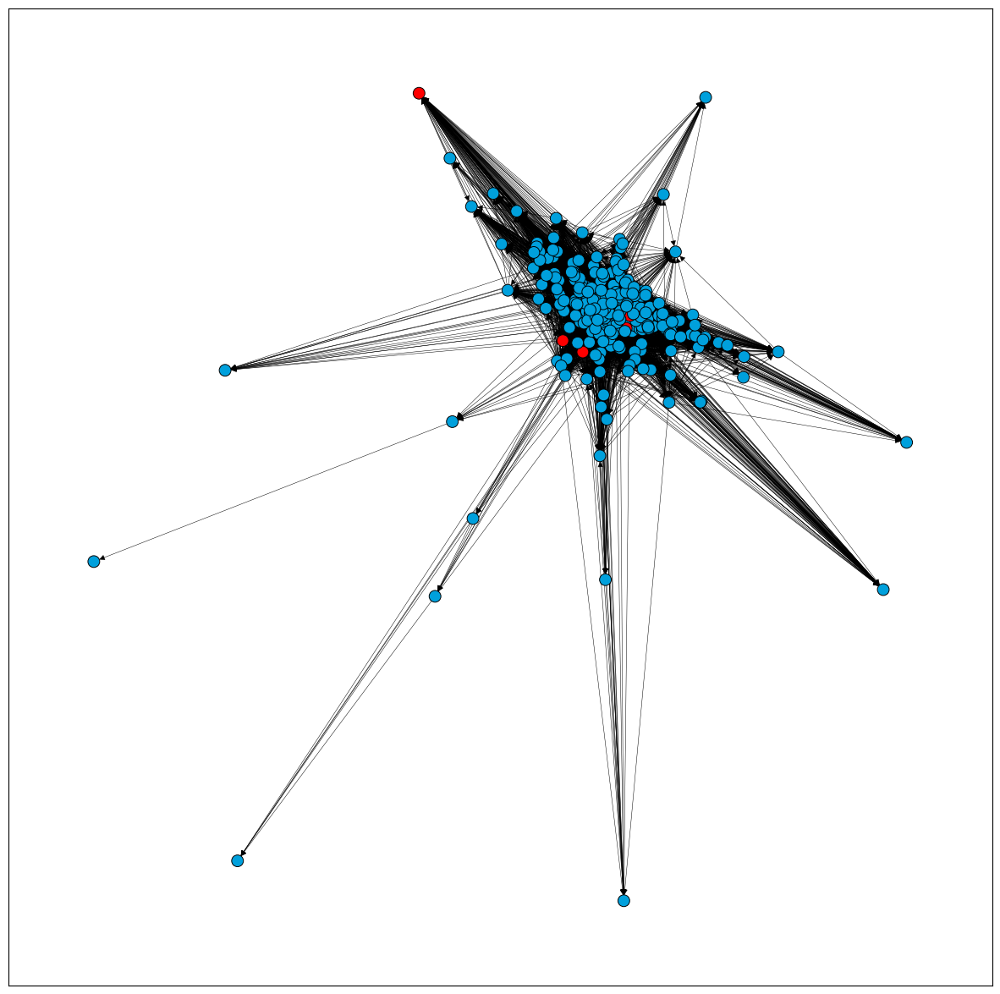

In [25]:
# influencers of top 3 communities in a list
infl_sg5 = list(set(sg5_close + sg5_bet))
infl_sg3 = list(set(sg3_close + sg3_bet))
infl_sg2 = list(set(sg2_close + sg2_bet))

# coloring influencers in red
color_infl_sg5 = ["red" if node in infl_sg5 else "#00A0DC" for node in sg5.nodes]
color_infl_sg3 = ["red" if node in infl_sg3 else "#00A0DC" for node in sg3.nodes]
color_infl_sg2 = ["red" if node in infl_sg2 else "#00A0DC" for node in sg2.nodes]

# plotting graphs with influencers
plot_function(graphs, [color_infl_sg5, color_infl_sg3, color_infl_sg2])


In [26]:
Total_Influencer_Cost = (len(infl_sg5) + len(infl_sg3) + len(infl_sg2)) * 10

Business: A telecom company launching a new data plan and wanting to create awareness and increase subscriptions.
Marketing Budget: $10,000
Cost per action (advertisement cost): $2

Now, with this data, we need to design a strategy to maximize the impact of our marketing campaign. We'll use the insights from our social network analysis to do this.

From our analysis, we have identified key influencers in the largest communities (sg5, sg3, sg2). These are the nodes that have the most direct influence on their network and can also reach a larger audience faster.

Let's assume that each influencer requires a more personalized marketing approach, costing $10 per action, because of their potential reach and influence.

We have:

len(infl_sg5) influencers in sg5 community
len(infl_sg3) influencers in sg3 community
len(infl_sg2) influencers in sg2 community

We can calculate the total cost for influencers:

Total_Influencer_Cost = (len(infl_sg5) + len(infl_sg3) + len(infl_sg2)) * 10

Target General Audience:

For the remaining budget, we can target the general audience in each community with a general ad costing $2 per action.

After allocating the budget for influencers, we have $10,000 - Total_Influencer_Cost remaining for the general audience.

Now, we can calculate the number of general users we can reach:

Total_General_Audience = (Budget - Total_Influencer_Cost) / 2

Distribution of General Audience:

We can distribute this audience across the three communities proportional to their sizes. The larger the community, the more of the general audience we target there.

Finally, implement this plan and monitor the progress of the campaign, checking metrics such as new subscriptions, awareness (e.g., mentions, shares), and overall reach of the campaign. 